In [1]:
from fastai.vision import *
from fastai.metrics import accuracy
from fastai.basic_data import *
import pandas as pd
from torch import optim
import re
import json
import cv2
from fastai.callbacks.hooks import num_features_model
from torch.nn import L1Loss


In [2]:
import numpy as np
import torch
import pandas as pd
import random
import string

# https://github.com/benhamner/Metrics/blob/master/Python/ml_metrics/average_precision.py
def apk(actual, predicted, k=10):
    if len(predicted)>k:
        predicted = predicted[:k]

    score = 0.0
    num_hits = 0.0

    for i,p in enumerate(predicted):
        if p in actual and p not in predicted[:i]:
            num_hits += 1.0
            score += num_hits / (i+1.0)

    if not actual:
        return 0.0

    return score / min(len(actual), k)

def mapk(actual, predicted, k=10):
    return np.mean([apk(a,p,k) for a,p in zip(actual, predicted)])

def map5kfast(preds, targs, k=10):
    predicted_idxs = preds.sort(descending=True)[1]
    top_5 = predicted_idxs[:, :5]
    scores = torch.zeros(len(preds), k).float()
    for kk in range(k):
        scores[:,kk] = (top_5[:,kk] == targs).float() / float((kk+1))
    return scores.max(dim=1)[0].mean()

def map5(preds,targs):
    if type(preds) is list:
        return torch.cat([map5fast(p, targs, 5).view(1) for p in preds ]).mean()
    return map5kfast(preds,targs, 5)

def top_5_preds(preds): return np.argsort(preds.numpy())[:, ::-1][:, :5]

def top_5_pred_labels(preds, classes):
    top_5 = top_5_preds(preds)
    labels = []
    for i in range(top_5.shape[0]):
        labels.append(' '.join([classes[idx] for idx in top_5[i]]))
    return labels

def create_submission(preds, data, name, classes=None):
    if not classes: classes = data.classes
    sub = pd.DataFrame({'Image': [path.name for path in data.test_ds.x.items]})
    sub['Id'] = top_5_pred_labels(preds, classes)
    sub.to_csv(f'subs/{name}.csv.gz', index=False, compression='gzip')


def intersection(preds, targs):
    # preds and targs are of shape (bs, 4), pascal_voc format
    max_xy = torch.min(preds[:, 2:], targs[:, 2:])
    min_xy = torch.max(preds[:, :2], targs[:, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, 0] * inter[:, 1]

def area(boxes):
    return ((boxes[:, 2]-boxes[:, 0]) * (boxes[:, 3]-boxes[:, 1]))

def union(preds, targs):
    return area(preds) + area(targs) - intersection(preds, targs)

def IoU(preds, targs):
    return intersection(preds, targs) / union(preds, targs)

def name(n=10, print_it=True):
    name = "".join(random.choice(string.ascii_lowercase) for _ in range(n))
    if print_it: print(name)
    return name

In [3]:
j = json.load(open('train-object-detect\\annotations.json'))


In [4]:
for i,temp in enumerate(j):
    test=temp['annotations']

In [5]:
SZ = 360


In [6]:
BOX_COLOR = (255, 0, 0)
TEXT_COLOR = (255, 255, 255)

def visualize_bbox(img, bbox, class_id, class_idx_to_name, color=BOX_COLOR, thickness=2):
    x_min, y_min, x_max, y_max = map(int, bbox)
#     x_min, y_min, w, h = bbox
#     x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    class_name = class_idx_to_name[class_id]
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(img, class_name, (x_min, y_min - int(0.3 * text_height)), cv2.FONT_HERSHEY_SIMPLEX, 0.35,TEXT_COLOR, lineType=cv2.LINE_AA)
    return img


def visualize(annotations, category_id_to_name):
    img = annotations['image'].copy()
    for idx, bbox in enumerate(annotations['bboxes']):
        img = visualize_bbox(img, bbox, annotations['category_id'][idx], category_id_to_name)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    return img

def get_aug(aug, min_area=0., min_visibility=0.):
    return albumentations.Compose(aug, bbox_params={'format': 'pascal_voc', 'min_area': min_area, 'min_visibility': min_visibility, 'label_fields': ['category_id']})

In [7]:
def j2anno(j):
    # bbox coordinates are returned in pascal voc format [x_min, y_min, x_max, y_max]
    im = cv2.imread(f"train-object-detect\\{j['filename']}", cv2.IMREAD_COLOR)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, (360,360), interpolation = cv2.INTER_AREA)
    im_height, im_width, _ = im.shape
                    
    orig_im = cv2.imread(f"train-object-detect\\{j['filename']}", cv2.IMREAD_COLOR)
    orig_im_height, orig_im_width, _ = orig_im.shape

    bbox_info = [anno for anno in j['annotations'] if anno['class'] == 'rect'][0]
    orig_bbox = [np.clip(bbox_info['x'], 0, orig_im_width), np.clip(bbox_info['y'], 0, orig_im_height), np.clip(bbox_info['x']+bbox_info['width'], 0, orig_im_width), np.clip(bbox_info['y']+bbox_info['height'], 0, orig_im_height)]
    bbox = [orig_bbox[0] * SZ / orig_im_width, orig_bbox[1] * SZ / orig_im_height, orig_bbox[2] * SZ / orig_im_width,  orig_bbox[3] * SZ / orig_im_height]
    return {'image': im, 'bboxes': [bbox], 'category_id': [0]}
                         
cat2name = {0: 'rect'}

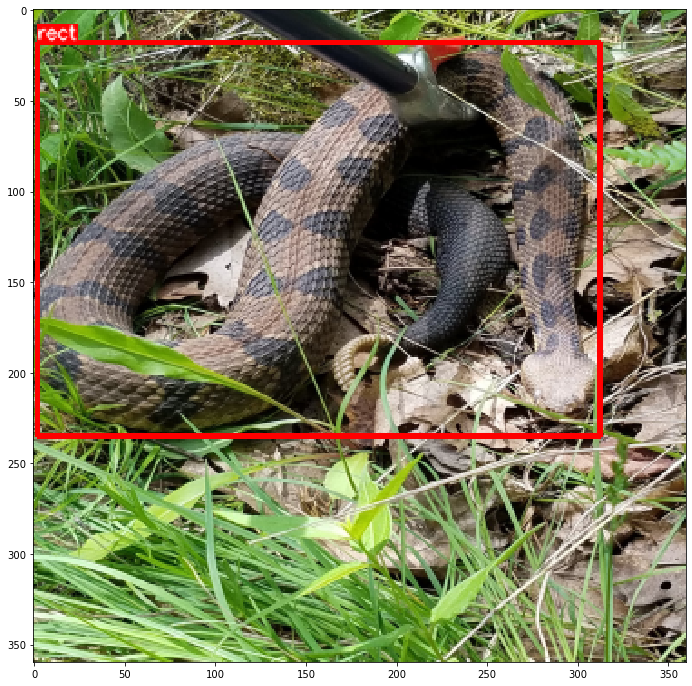

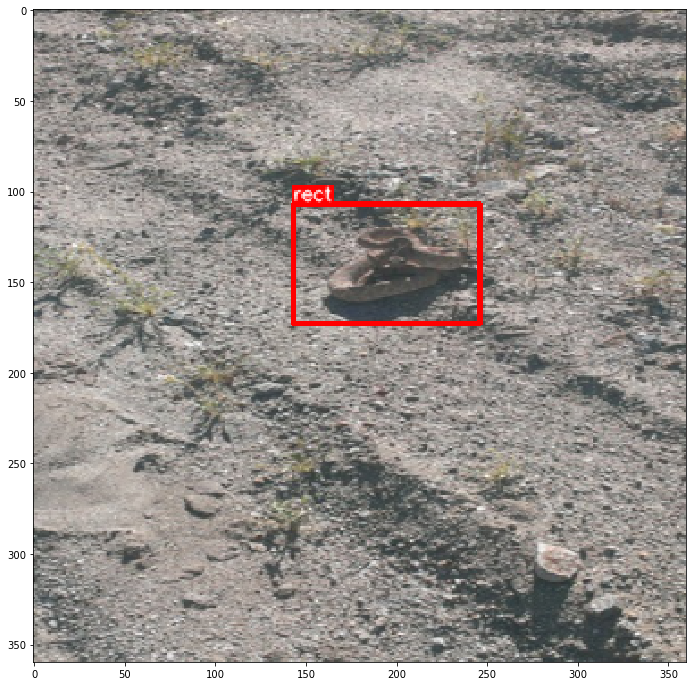

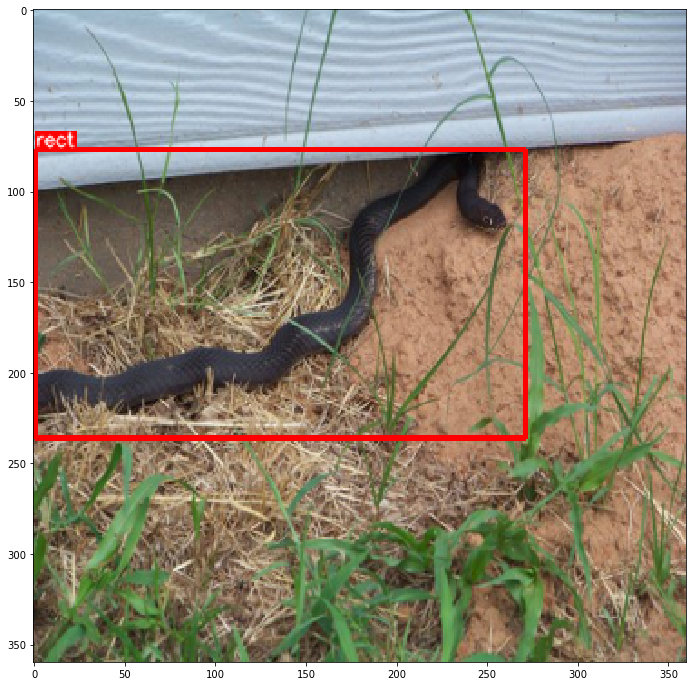

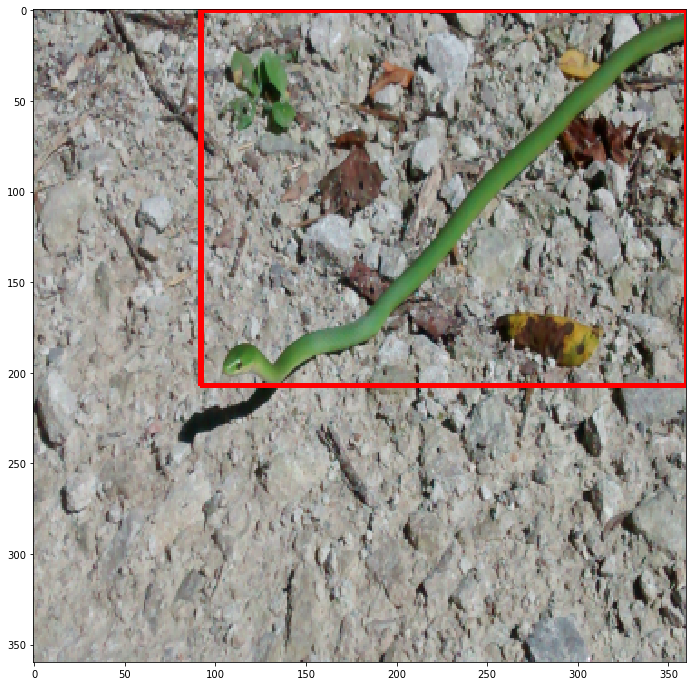

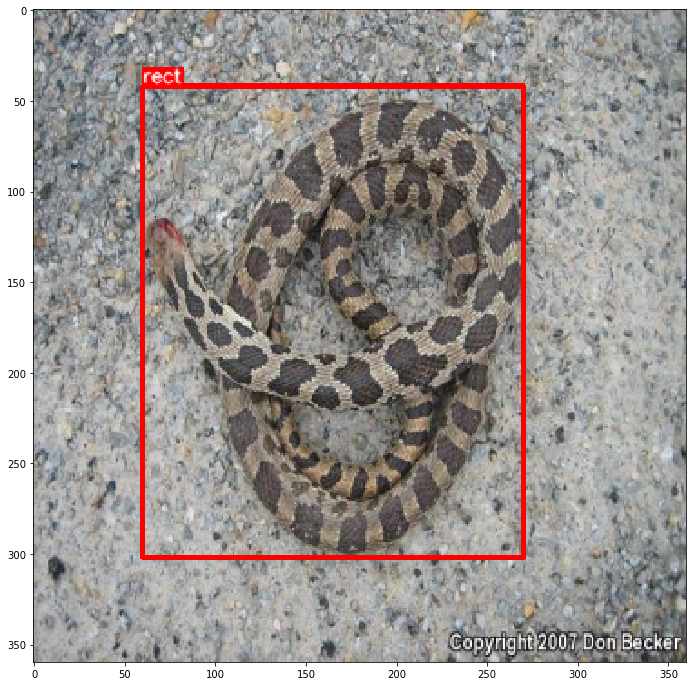

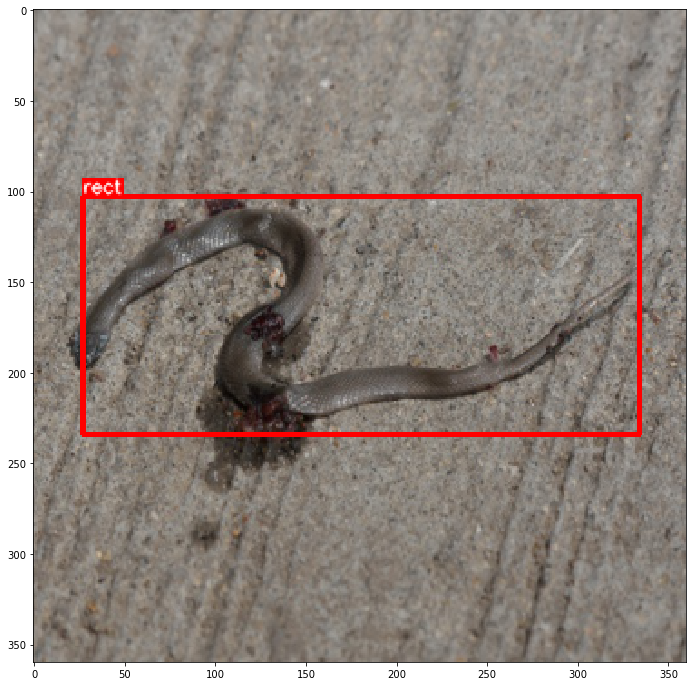

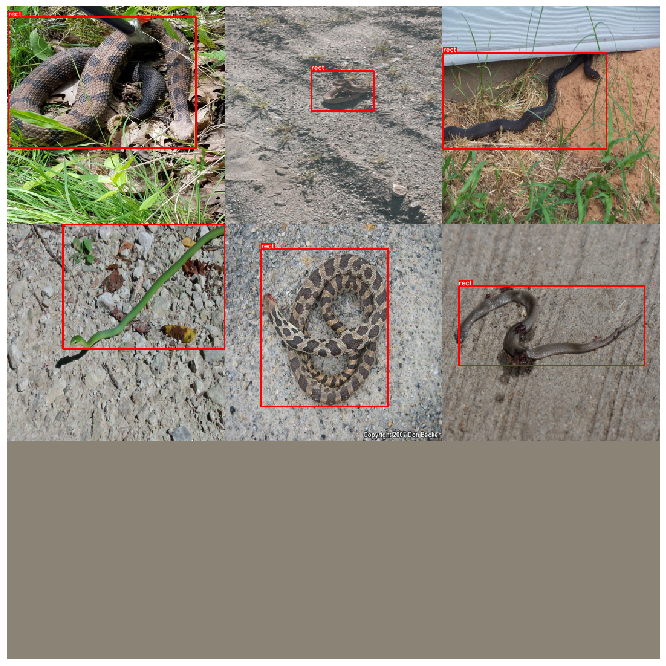

In [8]:
ims = np.stack([visualize(j2anno(j[i]), cat2name) for i in range(6)])
plt.figure(figsize=(12,12))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

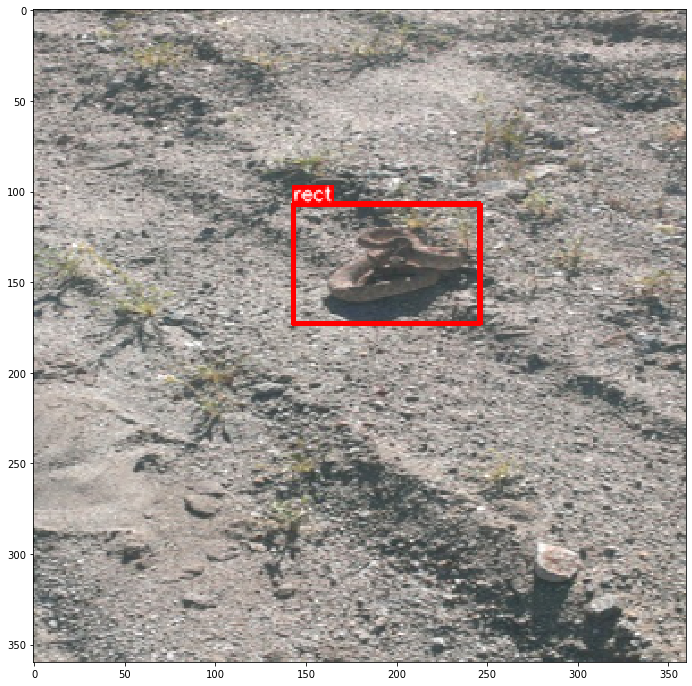

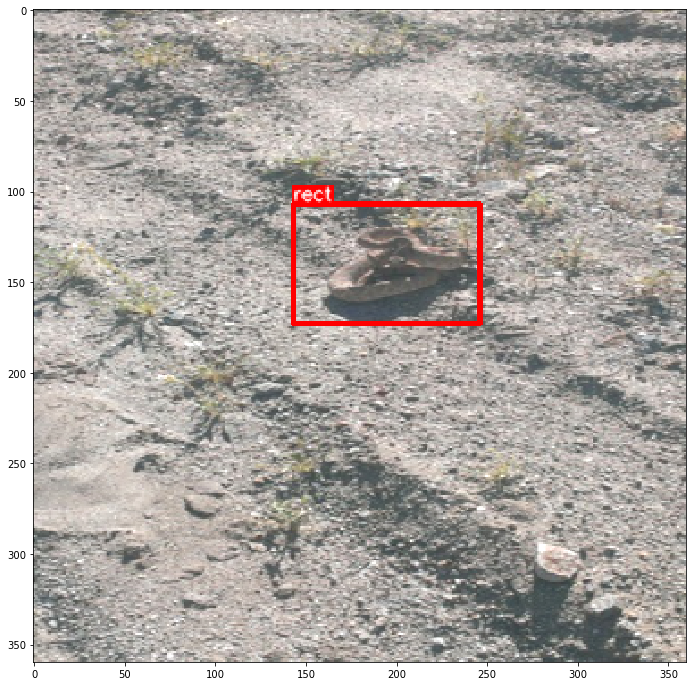

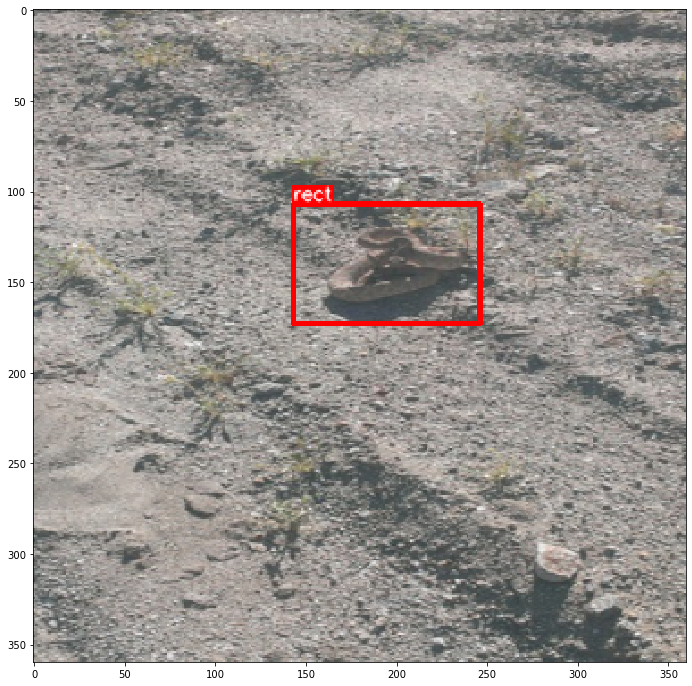

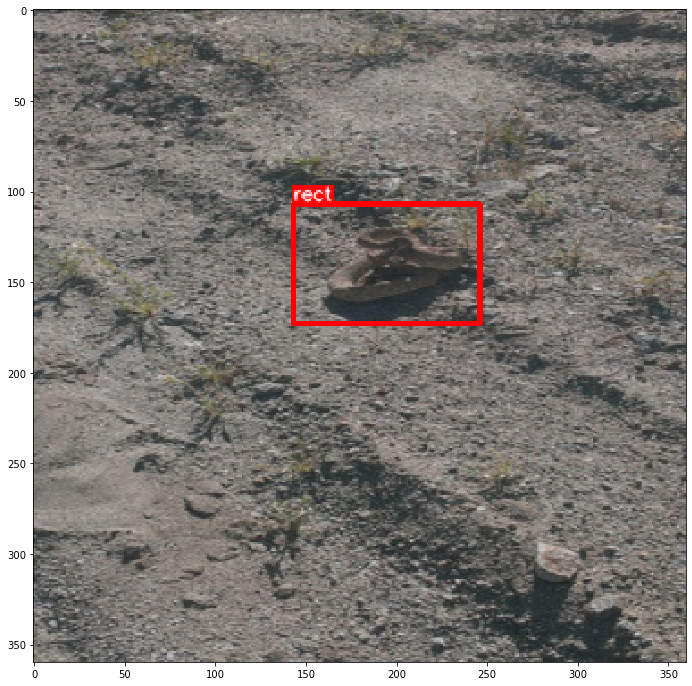

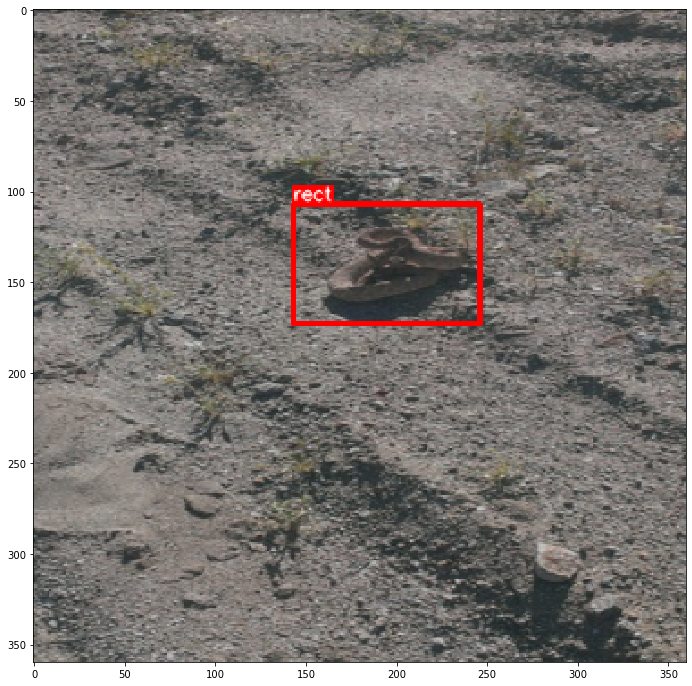

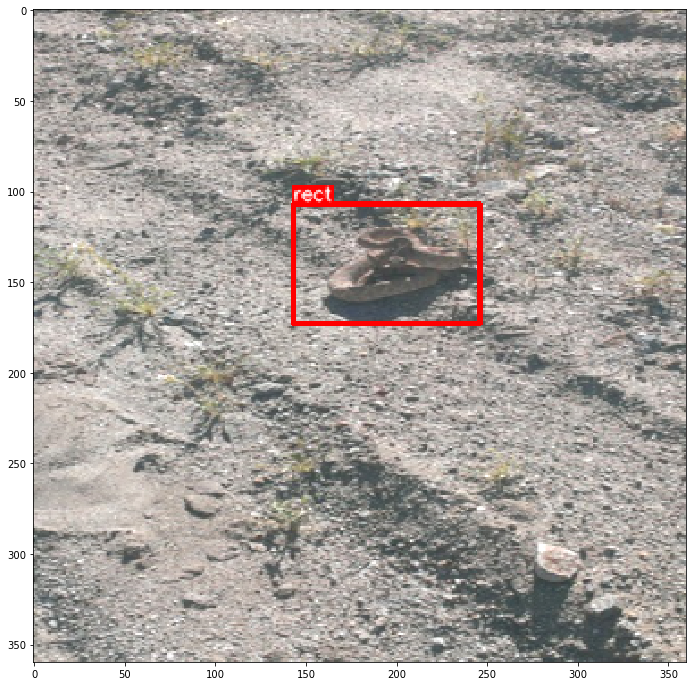

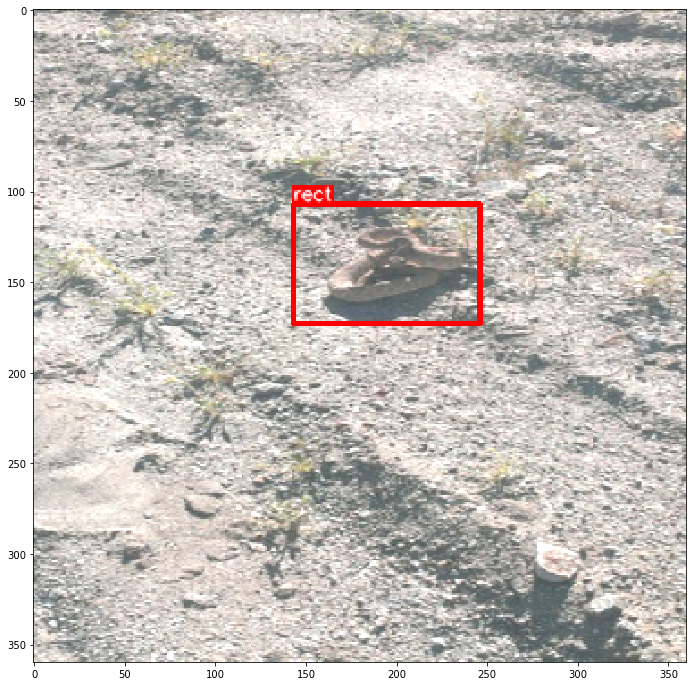

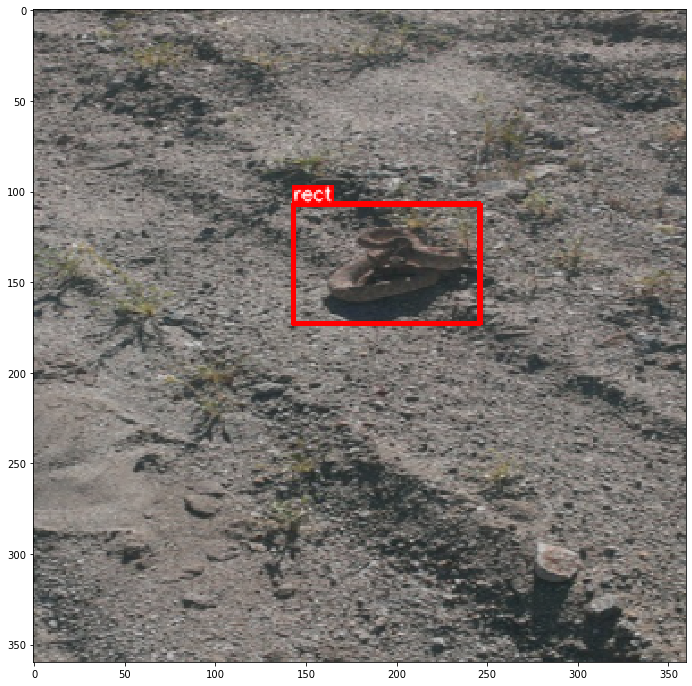

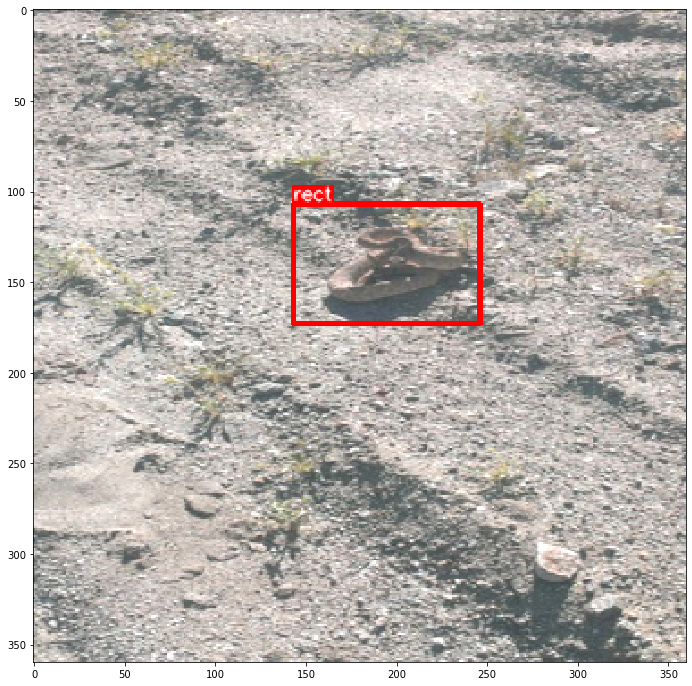

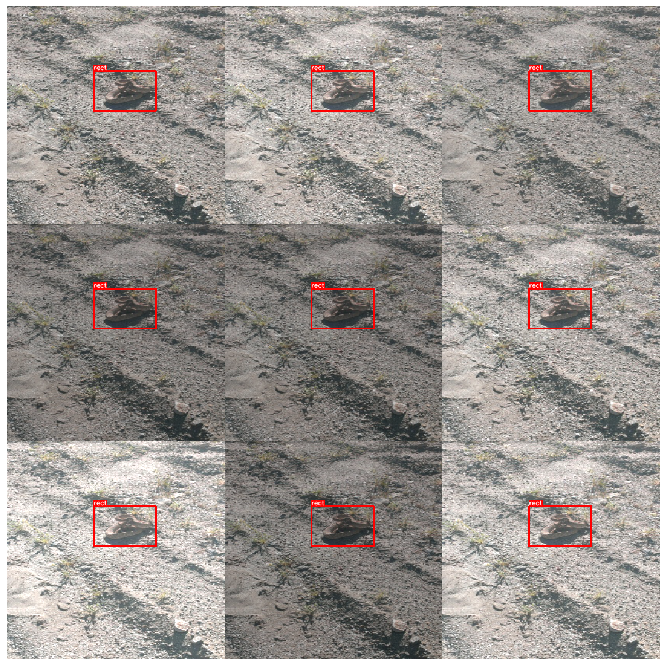

In [9]:
aug = get_aug([albumentations.RandomBrightnessContrast(always_apply=True)])

ims = np.stack([visualize(aug(**j2anno(j[1])), cat2name) for _ in range(9)])
plt.figure(figsize=(12,12))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

In [10]:
idxs = np.arange(len(j))


In [11]:
idxs

array([   0,    1,    2,    3, ..., 1419, 1420, 1421, 1422])

In [12]:
np.random.seed(0)
np.random.shuffle(idxs)
val_idxs = idxs[:285]

In [13]:
val_j = [anno for i, anno in enumerate(j) if i in val_idxs]
trn_j = [anno for i, anno in enumerate(j) if i not in val_idxs]

In [14]:
SZ=360

In [15]:
class CustomDataset(Dataset):
    def __init__(self, j, aug=None):
        self.j = j
        if aug is not None: aug = get_aug(aug)
        self.aug = aug
    
    def __getitem__(self, idx):
        item = j2anno(self.j[idx])
        if self.aug: item = self.aug(**item)
        im, bbox = item['image'], np.array(item['bboxes'][0])
        im, bbox = self.normalize_im(im), self.normalize_bbox(bbox)
        
        return im.transpose(2,0,1).astype(np.float32), bbox.astype(np.float32)
    
    def __len__(self):
        return len(self.j)
    
    def normalize_im(self, ary):
        return ((ary / 255 - imagenet_stats[0]) / imagenet_stats[1])
    
    def normalize_bbox(self, bbox):
        return bbox / SZ
    

In [16]:
trn_ds = CustomDataset(trn_j, [albumentations.RandomBrightnessContrast(always_apply=True)])
val_ds = CustomDataset(val_j)

In [62]:
src = (ImageList.from_folder(path='train').split_by_rand_pct(0.0).label_from_folder())

In [81]:
src.add_test_folder("C:\\contests\\snakes-breed\\round1_test\\round1")

LabelLists;

Train: LabelList (17686 items)
x: ImageList
Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360)
y: CategoryList
test,test,test,test,test
Path: test;

Valid: LabelList (0 items)
x: ImageList

y: CategoryList

Path: test;

Test: LabelList (17731 items)
x: ImageList
Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360)
y: EmptyLabelList
,,,,
Path: test

In [63]:
tfms = get_transforms(do_flip=True,flip_vert=False,max_rotate=10.0,max_zoom=1.1,max_lighting=0.2,max_warp=0.2,p_affine=0.75,p_lighting=0.75)


In [64]:
data = (src.transform(tfms, size=360, resize_method=ResizeMethod.SQUISH)
        .databunch(bs=32).normalize(imagenet_stats))

In [65]:
data

ImageDataBunch;

Train: LabelList (17686 items)
x: ImageList
Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360)
y: CategoryList
test,test,test,test,test
Path: test;

Valid: LabelList (0 items)
x: ImageList

y: CategoryList

Path: test;

Test: None

In [66]:
class SnakeDetector(nn.Module):
    def __init__(self, arch=models.resnet18):
        super().__init__() 
        self.cnn = create_body(arch)
        self.head = create_head(num_features_model(self.cnn) * 2, 4)
        
    def forward(self, im):
        x = self.cnn(im)
        x = self.head(x)
        return x.sigmoid_()

In [67]:
learn = Learner(data, SnakeDetector(arch=models.resnet50), loss_func=L1Loss())

In [68]:
learn.split([learn.model.cnn[:6], learn.model.cnn[6:], learn.model.head])


Learner(data=ImageDataBunch;

Train: LabelList (17686 items)
x: ImageList
Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360),Image (3, 360, 360)
y: CategoryList
test,test,test,test,test
Path: test;

Valid: LabelList (0 items)
x: ImageList

y: CategoryList

Path: test;

Test: None, model=SnakeDetector(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0

In [69]:
state_dict = torch.load('models\\snake-detection-model.pth')

In [70]:
learn.model.load_state_dict(state_dict['model'])


In [71]:
src.items[0]

WindowsPath('test/00046ff8b04d6fe7f9c5a9d8dca33561.jpg')

In [72]:
i=0
len(src.items)

17686

In [73]:
for i in range(0,len(src.items)):
    if i%10000==0:
        print(src.items[i])

test\00046ff8b04d6fe7f9c5a9d8dca33561.jpg
test\90f282c14520278c715a3a2a5100f9ae.jpg


In [74]:
filename=src.items[500]
filename = 'train\\class-4\\c3620dae599d2fe8369f80b2ace67e71.jpg'

In [75]:
im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
im = cv2.resize(im, (360,360), interpolation = cv2.INTER_AREA)
im_height, im_width, _ = im.shape

orig_im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
orig_im_height, orig_im_width, _ = orig_im.shape

In [76]:
orig_im_height

500

In [77]:
orig_im_width

281

In [78]:
to_pred = open_image(filename)

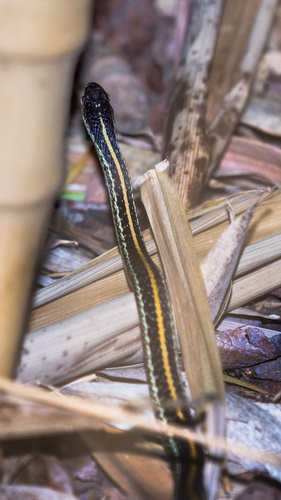

In [79]:
to_pred

In [80]:
_,_,bbox=learn.predict(to_pred)

IndexError: list index out of range

In [60]:
bbox *=360

In [61]:
bbox

tensor([ 63.4256,  32.9983, 291.5959, 307.0411])

In [ ]:
def draw_bbox(img, bbox, target=None, color=BOX_COLOR, thickness=2):
    
    x_min, y_min, x_max, y_max = map(int, bbox)
    print(img.shape)
    #cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    img = img[y_min:y_max,x_min:x_max]
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    cv2.imwrite('test_pred.png',img)
    return img

In [ ]:
ims = np.stack([draw_bbox(im, bbox) for i in range(9)])
plt.figure(figsize=(12,12))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

In [ ]:
bbox/=360

In [ ]:
im_original = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
im_original = cv2.cvtColor(im_original, cv2.COLOR_BGR2RGB)
im_original.shape

In [ ]:
bbox

In [ ]:
im_original_width = im_original.shape[1]
im_original_height = im_original.shape[0]

In [ ]:
im_original.shape

In [ ]:
bbox_new = bbox

In [ ]:
bbox_new

In [ ]:
bbox_new[0] = bbox_new[0]*im_original_width 
bbox_new[2]= bbox_new[2]*im_original_width

In [ ]:
bbox_new[1] = bbox_new[1]*im_original_height
bbox_new[3] = bbox_new[3]*im_original_height

In [ ]:
bbox_new

In [ ]:
bbox

In [ ]:
ims = np.stack([draw_bbox(im_original, bbox_new) for i in range(1)])
plt.figure(figsize=(20,20))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

In [ ]:
data.c

In [ ]:
import os
path = "train-snakes-cropped\\test\\"

In [ ]:
for c in data.classes:
    print(c)
    os.mkdir(path+c)

In [ ]:
count=0
for filename in src.items:
    print(count)
    im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, (360,360), interpolation = cv2.INTER_AREA)
    im_height, im_width, _ = im.shape

    orig_im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    orig_im_height, orig_im_width, _ = orig_im.shape
    to_pred = open_image(filename)
    _,_,bbox=learn.predict(to_pred)
    im_original = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    im_original = cv2.cvtColor(im_original, cv2.COLOR_BGR2RGB)
    im_original.shape
    im_original_width = im_original.shape[1]
    im_original_height = im_original.shape[0]
    bbox_new = bbox
    bbox_new[0] = bbox_new[0]*im_original_width 
    bbox_new[2]= bbox_new[2]*im_original_width
    bbox_new[1] = bbox_new[1]*im_original_height
    bbox_new[3] = bbox_new[3]*im_original_height
    x_min, y_min, x_max, y_max = map(int, bbox_new)
    #cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    im_original = im_original[y_min:y_max,x_min:x_max]
    im_original = cv2.cvtColor(im_original,cv2.COLOR_BGR2RGB)
    filename_str = str(filename)
    to_save = filename_str.replace('train','train-snakes-cropped')
    print(to_save)
    cv2.imwrite(to_save,im_original)
    count += 1

In [ ]:
src_new = (ImageList.from_folder(path='test').split_by_rand_pct(0.0).label_from_folder())

In [ ]:
count=0
for filename in src_new.items:
    print(count)
    im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, (360,360), interpolation = cv2.INTER_AREA)
    im_height, im_width, _ = im.shape

    orig_im = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    orig_im_height, orig_im_width, _ = orig_im.shape
    to_pred = open_image(filename)
    _,_,bbox=learn.predict(to_pred)
    im_original = cv2.imread(f"{filename}", cv2.IMREAD_COLOR)
    im_original = cv2.cvtColor(im_original, cv2.COLOR_BGR2RGB)
    im_original.shape
    im_original_width = im_original.shape[1]
    im_original_height = im_original.shape[0]
    bbox_new = bbox
    bbox_new[0] = bbox_new[0]*im_original_width 
    bbox_new[2]= bbox_new[2]*im_original_width
    bbox_new[1] = bbox_new[1]*im_original_height
    bbox_new[3] = bbox_new[3]*im_original_height
    x_min, y_min, x_max, y_max = map(int, bbox_new)
    #cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    im_original = im_original[y_min:y_max,x_min:x_max]
    im_original = cv2.cvtColor(im_original,cv2.COLOR_BGR2RGB)
    filename_str = str(filename)
    to_save = filename_str.replace('test','test-snakes-cropped')
    print(to_save)
    cv2.imwrite(to_save,im_original)
    count += 1